In [1]:
import plotly
import folium
import warnings
import Bio.SeqIO
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import plotly.express as px
import plotly.offline as py
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import re

from datetime import date
from Bio import Align, pairwise2
from Bio.Data import CodonTable
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot, plot_mpl

init_notebook_mode(connected=True)
plt.rcParams.update({'font.size': 14})


c:\Python311\Lib\site-packages\Bio\pairwise2.py:278: BiopythonDeprecationWarning:

Bio.pairwise2 has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.PairwiseAligner as a replacement, and contact the Biopython developers if you still need the Bio.pairwise2 module.



Data Proprocessing, cleaning and feature engineerin

In [4]:
confirmed_data = pd.read_csv('./time_series_covid_19_confirmed.csv')
deaths_data = pd.read_csv('./time_series_covid_19_deaths.csv')
recoveries_data = pd.read_csv('./time_series_covid_19_recovered.csv')
na_colums = (confirmed_data.isna().sum() / confirmed_data.shape[0]) > 0.99
na_colums = na_colums[na_colums]
confirmed_data = confirmed_data.drop(na_colums.index, axis=1)
deaths_data = deaths_data.drop(na_colums.index, axis=1)
recoveries_data = recoveries_data.drop(na_colums.index, axis=1)
confirmed_data = confirmed_data.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='confirmed')
deaths_data = deaths_data.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='deaths')
recoveries_data = recoveries_data.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='recoveries')
confirmed_data['date'] = pd.to_datetime(confirmed_data['date'])
deaths_data['date'] = pd.to_datetime(deaths_data['date'])
recoveries_data['date'] = pd.to_datetime(recoveries_data['date'])
full_data = confirmed_data.merge(recoveries_data).merge(deaths_data)
full_data = full_data.rename(columns={'Country/Region': 'Country', 'date': 'Date', 'confirmed': 'Confirmed', 'deaths': 'Deaths', 'recoveries': 'Recoveries'})
world_data = full_data.groupby(['Date']).agg({'Confirmed': ['sum'], 'Recoveries': ['sum'], 'Deaths': ['sum']}).reset_index()
world_data.columns = world_data.columns.get_level_values(0)

def add_rates(data):
    data['Confirmed Change'] = data['Confirmed'].diff().shift(-1)
    
    data['Mortality Rate'] = data['Deaths'] / data['Confirmed']
    data['Recovery Rate'] = data['Recoveries'] / data['Confirmed']
    data['Growth Rate'] = data['Confirmed Change'] / data['Confirmed']
    data['Growth Rate Change'] = data['Growth Rate'].diff().shift(-1)
    data['Growth Rate Accel'] = data['Growth Rate Change'] / data['Growth Rate']
    return data

world_data = add_rates(world_data)
    

C:\Users\ade18\AppData\Local\Temp\ipykernel_18596\1491068971.py:12: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\ade18\AppData\Local\Temp\ipykernel_18596\1491068971.py:13: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\ade18\AppData\Local\Temp\ipykernel_18596\1491068971.py:14: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



United Kingdom Cases Analysis

In [5]:
UK_data = full_data[full_data['Country'] == 'United Kingdom']

def plot_aggregate_metrics(data, fig=None):
    if fig is None:
        fig = go.Figure()
    fig.update_layout(template='plotly_dark', title='Aggregate Metrics')
    fig.add_trace(go.Scatter(x=data['Date'], y=data['Confirmed'], name='Confirmed', mode='lines+markers', line=dict(color='orange', width=2)))
    
    fig.add_trace(go.Scatter(x=data['Date'], y=data['Deaths'], name='Deaths', mode='lines+markers', line=dict(color='Red', width=2)))
    
    fig.add_trace(go.Scatter(x=data['Date'], y=data['Recoveries'], name='Recoveries', mode='lines+markers', line=dict(color='Blue', width=2)))
    
    return fig
plot_aggregate_metrics(UK_data).show()
    

World Case analysis


In [6]:
def plot_rates_metrics(data, fig=None):
    if fig is None:
        fig = go.Figure()
    fig.update_layout(template='plotly_dark', title='Rates Metrics')
    fig.add_trace(go.Scatter(x=data['Date'], y=data['Mortality Rate'], name='Mortality Rate', mode='lines+markers', line=dict(color='Red', width=3)))
    
    fig.add_trace(go.Scatter(x=data['Date'], y=data['Recovery Rate'], name='Recovery Rate', mode='lines+markers', line=dict(color='Blue', width=3)))
    
    fig.add_trace(go.Scatter(x=data['Date'], y=data['Growth Rate'], name='Growth Rate', mode='lines+markers', line=dict(color='orange', width=2)))
    
    fig.update_layout(yaxis=dict(tickformat=".2%")) 
    
    return fig


world_data = world_data
plot_rates_metrics(world_data).show()

Log scaled Confirmed Cases by Country

In [7]:
confirmed_country_data = full_data.groupby(['Date', 'Country']).sum().reset_index()
fig = px.line(confirmed_country_data, x='Date', y='Confirmed', color='Country', title='Confirmed Cases by Country', line_group='Country', hover_name='Country')
fig.update_layout(template='plotly_dark', yaxis_type="log")
fig.show()

Dataset Preparations for Predicting Mutations/Next seq in RNA


In [24]:
# Path to the file
path = './MN908947.txt'

file=open(path,'r')
empty_data=[[]]
for line in file:
    empty_data.append([line])
df1=pd.DataFrame(empty_data,columns=['sequence'])
df1=df1.drop(df1.index[0],axis=0)
df1=df1.drop(df1.index[0],axis=0)
df1=df1.drop(df1.index[427],axis=0)
df1



,sequence
2,ATTAAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGA...
3,CGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTG...
4,TAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGC...
5,TTGCAGCCGATCATCAGCACATCTAGGTTTCGTCCGGGTGTGACCG...
6,CCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTT...
...,...
424,CAGACCACACAAGGCAGATGGGCTATATAAACGTTTTCGCTTTTCC...
425,GTGCAGAATGAATTCTCGTAACTACATAGCACAAGTAGATGTAGTT...
426,TTAATCAGTGTGTAACATTAGGGAGGACTTGAAAGAGCCACCACAT...
427,GATCGAGTGTACAGTGAACAATGCTAGGGAGAGCTGCCTATATGGA...


In [25]:
# Extracting sequences and initializing the Tokenizer
abstracts = df1['sequence']
tokenizer = tf.keras.preprocessing.text.Tokenizer(lower=False, char_level=True)
tokenizer.fit_on_texts(abstracts)

# Convert sequences to integer representation (this line can be omitted if you don't use 'sequences' later)
sequences = tokenizer.texts_to_sequences(abstracts)

# Display the mapping of integer IDs to characters
tokenizer.index_word


{1: 'T', 2: 'A', 3: 'G', 4: 'C', 5: '\n'}

In [26]:
training_length = 70
num_words = len(idx_word) + 1

# Extract features and labels using list comprehension
features = [seq[i-training_length:i-1] for seq in sequences for i in range(training_length, len(seq))]
labels = [seq[i-1] for seq in sequences for i in range(training_length, len(seq))]

# One-hot encode the labels
y = np.zeros((len(labels), num_words), dtype=np.int8)
y[np.arange(len(labels)), labels] = 1

# Convert features to numpy array
X = np.array(features)

# Let's determine the appropriate reshaping dimensions
total_sequences = X.shape[0]
seq_per_batch = total_sequences // 7

# Reshape
X = X.reshape(7, seq_per_batch, -1)  # -1 will automatically calculate the needed dimension
y = y.reshape(7, seq_per_batch, -1)

# Display the shapes
print(f"Shape of X is: {X.shape} Shape of y is: {y.shape}")

# Split the data into training and testing sets (e.g., 80% train and 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


Shape of X is: (7, 61, 69) Shape of y is: (7, 61, 6)


In [40]:
def build_lstm_network():
    """Constructs and returns a bidirectional LSTM model."""
    
    # Defining input shape dynamically
    input_shape = X_train.shape[1:]
    main_input = tf.keras.layers.Input(shape=input_shape, name="main_input")

    # Bidirectional LSTM layer
    lstm_out = tf.keras.layers.Bidirectional(
        tf.keras.layers.LSTM(units=128, return_sequences=True),
        name="build_lstm"
    )(main_input)

    # Sequence of dense layers
    dense1 = tf.keras.layers.Dense(
        64, activation='relu',
        kernel_initializer=tf.keras.initializers.RandomNormal(0, 0.05),
        bias_initializer='zeros',
        kernel_regularizer=tf.keras.regularizers.L1L2(1e-5, 1e-4),
        bias_regularizer=tf.keras.regularizers.L2(1e-4),
        activity_regularizer=tf.keras.regularizers.L2(1e-5),
        name="dense_1"
    )(lstm_out)
    
    dense2 = tf.keras.layers.Dense(
        32, activation='relu',
        kernel_initializer=tf.keras.initializers.RandomNormal(0, 0.05),
        bias_initializer='zeros',
        kernel_regularizer=tf.keras.regularizers.L1L2(1e-5, 1e-4),
        bias_regularizer=tf.keras.regularizers.L2(1e-4),
        activity_regularizer=tf.keras.regularizers.L2(1e-5),
        name="dense_2"
    )(dense1)
    
    final_output = tf.keras.layers.Dense(
        num_words, activation='softmax', name="output_layer"
    )(dense2)

    # Assemble and compile model
    lstm_model = tf.keras.models.Model(inputs=main_input, outputs=final_output, name="bi_lstm_model")
    lstm_model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])
    
    return lstm_model

# Instantiate and print summary
network = build_lstm_network()
print(network.summary())


Model: "bi_lstm_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 61, 69)]          0         
                                                                 
 build_lstm (Bidirectional)  (None, 61, 256)           202752    
                                                                 
 dense_1 (Dense)             (None, 61, 64)            16448     
                                                                 
 dense_2 (Dense)             (None, 61, 32)            2080      
                                                                 
 output_layer (Dense)        (None, 61, 6)             198       
                                                                 
Total params: 221478 (865.15 KB)
Trainable params: 221478 (865.15 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


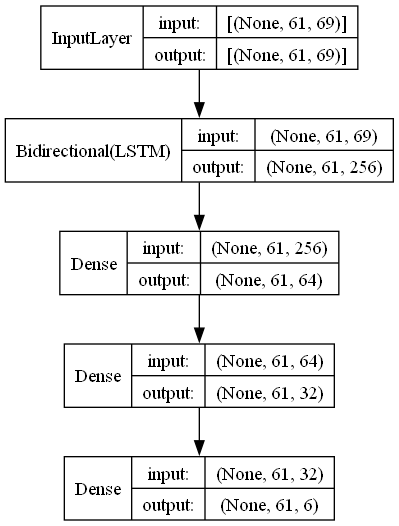

In [36]:
# Saving and visualizing the model architecture
model_diagram_file = "training_model.png"
tf.keras.utils.plot_model(network, show_shapes=True, show_layer_names=False, to_file=model_diagram_file)


In [41]:
lstmhistory = network.fit(X_test, y_test, epochs=60, validation_data=(X_test, y_test), verbose=1)

# After training, evaluate on the test set
test_loss, test_accuracy = network.evaluate(X_test, y_test)
print(f"Test accuracy: {test_accuracy:.4f}")
print(f"Test loss: {test_loss:.4f}")


Epoch 1/60
1/1 [==============================] - 5s 5s/step - loss: 0.1547 - accuracy: 0.0000e+00 - val_loss: 0.1505 - val_accuracy: 0.2951
Epoch 2/60
1/1 [==============================] - 0s 70ms/step - loss: 0.1505 - accuracy: 0.2951 - val_loss: 0.1490 - val_accuracy: 0.3525
Epoch 3/60
1/1 [==============================] - 0s 67ms/step - loss: 0.1490 - accuracy: 0.3525 - val_loss: 0.1480 - val_accuracy: 0.3607
Epoch 4/60
1/1 [==============================] - 0s 64ms/step - loss: 0.1480 - accuracy: 0.3607 - val_loss: 0.1473 - val_accuracy: 0.2869
Epoch 5/60
1/1 [==============================] - 0s 66ms/step - loss: 0.1473 - accuracy: 0.2869 - val_loss: 0.1469 - val_accuracy: 0.2787
Epoch 6/60
1/1 [==============================] - 0s 71ms/step - loss: 0.1469 - accuracy: 0.2787 - val_loss: 0.1464 - val_accuracy: 0.2787
Epoch 7/60
1/1 [==============================] - 0s 63ms/step - loss: 0.1464 - accuracy: 0.2787 - val_loss: 0.1458 - val_accuracy: 0.2787
Epoch 8/60
1/1 [=========

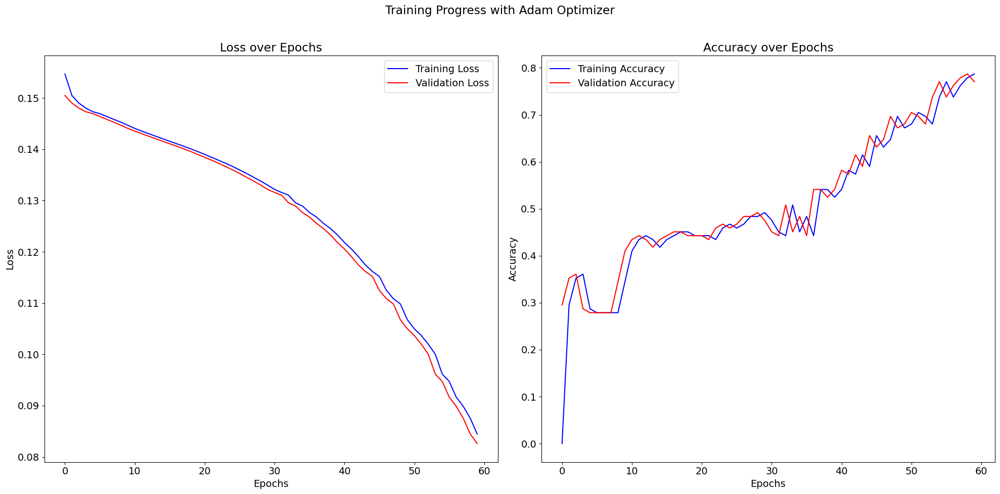

In [44]:
def visualize_metrics(hist):
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    
    # Loss plot
    ax[0].set_title("Loss over Epochs")
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("Loss")
    ax[0].plot(hist.history['loss'], 'b-', label="Training Loss")
    ax[0].plot(hist.history['val_loss'], 'r-', label="Validation Loss")
    ax[0].legend()

    # Accuracy plot
    ax[1].set_title("Accuracy over Epochs")
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Accuracy")
    ax[1].plot(hist.history['accuracy'], 'b-', label="Training Accuracy")
    ax[1].plot(hist.history['val_accuracy'], 'r-', label="Validation Accuracy")
    ax[1].legend()

    fig.suptitle("Training Progress with Adam Optimizer")
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# Call the refactored function
visualize_metrics(lstmhistory)


Saving the LSTM Model graph

In [45]:
network.save('lstmmodel.h5')

In [49]:
def transformer_block(inputs, head_sz, n_heads, ff_units, drop_rate):
    # Attention Mechanism
    attn_out = tf.keras.layers.LayerNormalization(epsilon=1e-6)(inputs)
    attn_out = tf.keras.layers.MultiHeadAttention(key_dim=head_sz, num_heads=n_heads, dropout=drop_rate)(attn_out, attn_out)
    attn_out = tf.keras.layers.Dropout(drop_rate)(attn_out)
    attn_out += inputs
    
    # Feed Forward
    ff_out = tf.keras.layers.LayerNormalization(epsilon=1e-6)(attn_out)
    ff_out = tf.keras.layers.Conv1D(filters=ff_units, kernel_size=1, activation="relu")(ff_out)
    ff_out = tf.keras.layers.Dropout(drop_rate)(ff_out)
    ff_out = tf.keras.layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(ff_out)
    return ff_out + attn_out

def construct_model(inp_shape, head_sz, n_heads, ff_units, transformer_blks, mlp_dims, drop_rate, mlp_drop):
    in_tensor = tf.keras.Input(shape=inp_shape)
    x = in_tensor
    for _ in range(transformer_blks):
        x = transformer_block(x, head_sz, n_heads, ff_units, drop_rate)

    for units in mlp_dims:
        x = tf.keras.layers.Dense(units, activation="relu", 
                                  kernel_initializer=tf.keras.initializers.RandomNormal(0., 0.05),
                                  bias_initializer='zeros',
                                  kernel_regularizer=tf.keras.regularizers.L1L2(1e-5, 1e-4),
                                  bias_regularizer=tf.keras.regularizers.L2(1e-4),
                                  activity_regularizer=tf.keras.regularizers.L2(1e-5))(x)
        x = tf.keras.layers.Dropout(mlp_drop)(x)

    final_out = tf.keras.layers.Dense(6, activation="softmax")(x)
    return tf.keras.Model(in_tensor, final_out)

inp_shape = X_train.shape[1:]
neural_net = construct_model(inp_shape, 256, 4, 4, 4, [128], 0.7, 0.4)

neural_net.compile(
    loss=tf.keras.losses.mean_squared_error,
    optimizer=tf.keras.optimizers.Adam(1e-4),
    metrics=["accuracy"]
)
print(neural_net.summary())


Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 61, 69)]             0         []                            
                                                                                                  
 layer_normalization_16 (La  (None, 61, 69)               138       ['input_5[0][0]']             
 yerNormalization)                                                                                
                                                                                                  
 multi_head_attention_8 (Mu  (None, 61, 69)               285765    ['layer_normalization_16[0][0]
 ltiHeadAttention)                                                  ',                            
                                                                     'layer_normalization_16

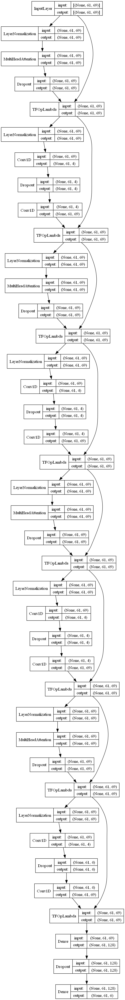

In [53]:
model_diagram_2 = "transformermodel.png"
tf.keras.utils.plot_model(neural_net, show_shapes=True, show_layer_names=False, to_file=model_diagram_2)


In [52]:
trans_history = neural_net.fit(X_train, y_train, epochs=60, validation_data=(X_test, y_test), verbose=1)

# After training, evaluate on the Train set
train_loss, train_accuracy = neural_net.evaluate(X_train, y_train)
print(f"Train accuracy: {train_accuracy:.4f}")
print(f"Train loss: {train_loss:.4f}")

Epoch 1/60
1/1 [==============================] - 0s 313ms/step - loss: 0.0762 - accuracy: 0.7869 - val_loss: 0.1534 - val_accuracy: 0.2623
Epoch 2/60
1/1 [==============================] - 0s 272ms/step - loss: 0.0754 - accuracy: 0.7967 - val_loss: 0.1535 - val_accuracy: 0.2623
Epoch 3/60
1/1 [==============================] - 0s 294ms/step - loss: 0.0740 - accuracy: 0.7967 - val_loss: 0.1536 - val_accuracy: 0.2623
Epoch 4/60
1/1 [==============================] - 0s 279ms/step - loss: 0.0761 - accuracy: 0.7902 - val_loss: 0.1537 - val_accuracy: 0.2541
Epoch 5/60
1/1 [==============================] - 0s 281ms/step - loss: 0.0764 - accuracy: 0.7705 - val_loss: 0.1539 - val_accuracy: 0.2541
Epoch 6/60
1/1 [==============================] - 0s 296ms/step - loss: 0.0772 - accuracy: 0.7705 - val_loss: 0.1541 - val_accuracy: 0.2623
Epoch 7/60
1/1 [==============================] - 0s 282ms/step - loss: 0.0749 - accuracy: 0.7770 - val_loss: 0.1543 - val_accuracy: 0.2541
Epoch 8/60
1/1 [====

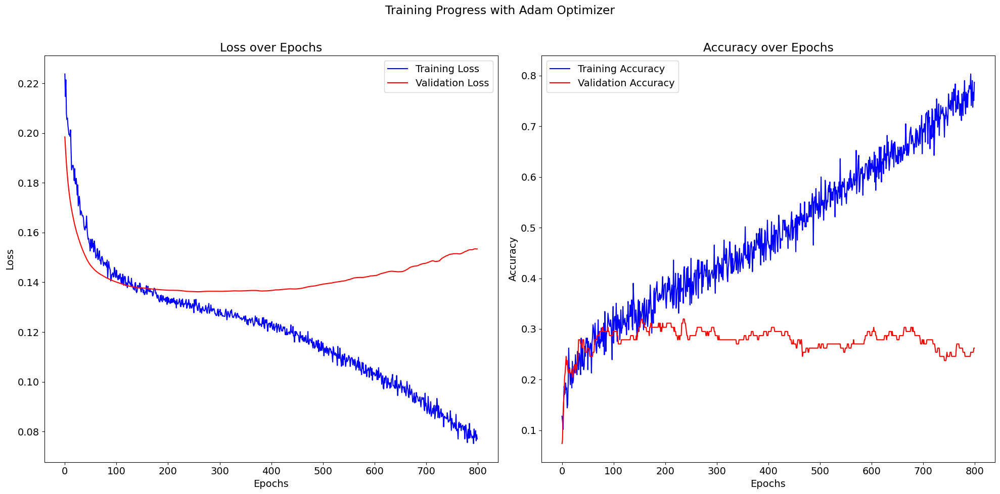

In [51]:
trans_history = neural_net.fit(X_train,y_train,validation_data=(X_test, y_test),epochs=800,verbose=0)
visualize_metrics(trans_history)

